In [1]:
from torch.utils.data import DataLoader
import os
from tqdm.notebook import tqdm
from pathlib import Path

import torch.optim as optim
import pandas as pd
import torch.nn as nn
import torch

from torch.utils.data import Dataset
import numpy as np
from torchvision import transforms

from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
!pip install deep-pipe
from dpipe.io import load_numpy
from dpipe.im.metrics import dice_score

     |████████████████████████████████| 71kB 3.6MB/s 
     |████████████████████████████████| 71kB 4.5MB/s 
  Created wheel for deep-pipe: filename=deep_pipe-0.1.0-cp37-none-any.whl size=92458 sha256=97430e997ef63c98f8fe874035cc390a5d33760a1305962e199485448eaab206
  Stored in directory: /root/.cache/pip/wheels/e0/60/3a/1134b57cc46bb842abff81f9c416d484b04cfa14e0c3503409
  Created wheel for pdp: filename=pdp-0.3.0-cp37-none-any.whl size=6620 sha256=cbfe7b9152172596c4ff6da9f79b6ff141e02d3a02601de904482d2fef194c09
  Stored in directory: /root/.cache/pip/wheels/84/fb/5e/afb783110614b3c1a4187e6f83e4f4ea0088fbdb82921013a2
  Created wheel for tensorboard-easy: filename=tensorboard_easy-0.2.3-cp37-none-any.whl size=16285 sha256=362f9f89a37f158a5645a3f1cf63b65e3b23e23a846a0b873739b9c3134aa43b
  Stored in directory: /root/.cache/pip/wheels/b4/ed/f8/8d162ed84536607319e7180c751ccdd7f433078f8122fa0d93
  Created wheel for lazycon: filename=lazycon-0.3.0-cp37-none-any.whl size=18947 sha256=9a291201087

Диск и распаковка

In [12]:
import zipfile
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
brats = zipfile.ZipFile('/content/drive/MyDrive/flair_t2.zip', 'r')
brats.extractall('/content')

p - все пути BraTS20_Training_...

In [5]:
data_folder = Path('/content/flair_t2')
p = []
for paths, r, files in tqdm(os.walk(data_folder)):
    p.append(paths)

In [6]:
p

['/content/flair_t2',
 '/content/flair_t2/BraTS20_Training_043',
 '/content/flair_t2/BraTS20_Training_341',
 '/content/flair_t2/BraTS20_Training_057',
 '/content/flair_t2/BraTS20_Training_241',
 '/content/flair_t2/BraTS20_Training_221',
 '/content/flair_t2/BraTS20_Training_139',
 '/content/flair_t2/BraTS20_Training_025',
 '/content/flair_t2/BraTS20_Training_282',
 '/content/flair_t2/BraTS20_Training_186',
 '/content/flair_t2/BraTS20_Training_359',
 '/content/flair_t2/BraTS20_Training_334',
 '/content/flair_t2/BraTS20_Training_309',
 '/content/flair_t2/BraTS20_Training_053',
 '/content/flair_t2/BraTS20_Training_197',
 '/content/flair_t2/BraTS20_Training_133',
 '/content/flair_t2/BraTS20_Training_076',
 '/content/flair_t2/BraTS20_Training_232',
 '/content/flair_t2/BraTS20_Training_074',
 '/content/flair_t2/BraTS20_Training_004',
 '/content/flair_t2/BraTS20_Training_289',
 '/content/flair_t2/BraTS20_Training_281',
 '/content/flair_t2/BraTS20_Training_114',
 '/content/flair_t2/BraTS20_Trai

Удаляем первый элемент /content/flair_t2

In [7]:
p.remove('/content/flair_t2')

Поиск max() по пациентам

In [8]:
max1_ = []
max2_ = []
for i in range(len(p)):
  max1 = 0
  max2 = 0
  for paths, _, files in tqdm(os.walk(p[i])):
    for file in files:
      if 'flair' in file:
        image1 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image1.max() > max1:
          max1 = image1.max()
      if 't2' in file:
        image2 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image2.max() > max2:
          max2 = image2.max()
  max1_.append(max1)
  max2_.append(max2)

print(max1_)
print(max2_)           


[933.0, 1359.5203, 697.0, 649.0, 339.0, 798.0, 711.0, 467.0, 389.0, 2864.0, 1176.0, 1440.0, 625.0, 243.0, 1431.0, 769.0, 884.0, 1318.0, 757.0, 547.0, 1356.0, 1223.0, 2292.0, 1094.0, 693.0, 652.0, 645.0, 2452.0347, 2108.0, 133.0, 1541.0, 2677.0, 457.64474, 1086.0, 1057.0, 2582.0, 629.0, 360.0, 1005.0, 897.0, 968.0, 613.0, 761.0, 760.0, 1583.0, 1426.0, 1356.0, 880.0, 1503.0, 575.0, 1908.0, 370.0, 514.0, 1440.0, 1116.0, 1069.0, 2926.0, 827.0, 32767.0, 1332.0, 1595.0, 1595.3712, 555.0, 1988.0, 1200.0, 1417.0, 404.0, 1127.0, 2043.0, 786.0, 1072.0, 508.0, 1755.0, 1107.0, 827.0, 696.0, 1345.0, 2403.0, 2902.0, 918.0, 606.0, 552.0, 1696.0, 1019.0, 357.0, 764.8788, 1545.0, 2396.0, 1937.0, 445.0, 1135.0, 624.0, 1477.0, 681.0, 1059.0, 1502.0, 1876.0, 984.0, 2139.0, 917.0, 32767.0, 517.0, 1563.0, 438.0, 461.0, 1163.0, 473.0, 1171.0, 615.0, 995.0, 1224.0, 729.0, 699.0, 32767.0, 1020.0, 631.0, 1324.0, 1111.0, 727.0, 445.0, 497.0, 2325.0, 569.0, 1460.0, 2073.0, 346.0, 1012.0, 422.0, 894.0, 1093.0, 47

Гистограммы image1 и image2 соответственно

(array([364.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   4.]),
 array([  133. ,  3396.4,  6659.8,  9923.2, 13186.6, 16450. , 19713.4,
        22976.8, 26240.2, 29503.6, 32767. ], dtype=float32),
 <a list of 10 Patch objects>)

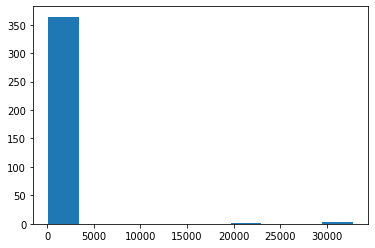

In [9]:
plt.hist(max1_)

(array([309.,  43.,   5.,   7.,   0.,   0.,   0.,   0.,   0.,   5.]),
 array([  141. ,  3403.6,  6666.2,  9928.8, 13191.4, 16454. , 19716.6,
        22979.2, 26241.8, 29504.4, 32767. ], dtype=float32),
 <a list of 10 Patch objects>)

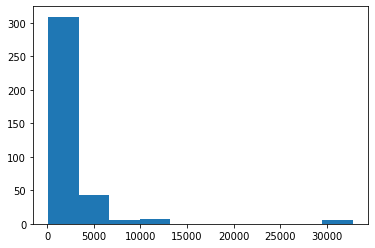

In [10]:
plt.hist(max2_)

Удалил пациентов у которых больше 5000. Вот что получилось.

Датасет с удалёнными

In [13]:
brats = zipfile.ZipFile('/content/drive/MyDrive/flair_t2_del.zip', 'r')
brats.extractall('/content')

In [14]:
data_folder = Path('/content/flair_t2_del')
p = []
for paths, r, files in tqdm(os.walk(data_folder)):
    p.append(paths)

In [15]:
p.remove('/content/flair_t2_del')

Код для нахождения пациентов 5000< (dele1, dele2)

In [16]:
max1_ = []
max2_ = []
dele1 = []
dele2 = []
for i in range(len(p)):
  max1 = 0
  max2 = 0
  for paths, _, files in tqdm(os.walk(p[i])):
    for file in files:
      if 'flair' in file:
        image1 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image1.max() > max1 and image1.max() <= 5000:
          max1 = image1.max()
        if image1.max() > 5000:
          dele1.append(p[i])
      if 't2' in file:
        image2 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image2.max() > max2 and image2.max() <= 5000:
          max2 = image2.max()
        if image2.max() > 5000:
          dele2.append(p[i])  
  max1_.append(max1)
  max2_.append(max2)      

Поиск max() по пациентам. Сокращённый датасет.

In [17]:
max1_ = []
max2_ = []
for i in range(len(p)):
  max1 = 0
  max2 = 0
  for paths, _, files in tqdm(os.walk(p[i])):
    for file in files:
      if 'flair' in file:
        image1 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image1.max() > max1:
          max1 = image1.max()
      if 't2' in file:
        image2 = load_numpy(Path(p[i]) / file, allow_pickle=True, decompress=True)
        if image2.max() > max2:
          max2 = image2.max()
  max1_.append(max1)
  max2_.append(max2)

print(max1_)
print(max2_)   


[933.0, 1359.5203, 697.0, 649.0, 339.0, 798.0, 711.0, 467.0, 389.0, 1176.0, 1440.0, 625.0, 243.0, 1431.0, 769.0, 884.0, 1318.0, 757.0, 547.0, 1356.0, 1223.0, 2292.0, 1094.0, 693.0, 652.0, 645.0, 133.0, 1541.0, 2677.0, 457.64474, 1086.0, 1057.0, 629.0, 360.0, 1005.0, 897.0, 968.0, 613.0, 761.0, 760.0, 1583.0, 1426.0, 1356.0, 880.0, 1503.0, 575.0, 370.0, 514.0, 1440.0, 1116.0, 1069.0, 827.0, 1332.0, 1595.0, 1595.3712, 555.0, 1988.0, 1200.0, 1417.0, 404.0, 1127.0, 786.0, 1072.0, 508.0, 1755.0, 1107.0, 827.0, 696.0, 1345.0, 918.0, 606.0, 552.0, 1696.0, 1019.0, 357.0, 764.8788, 1545.0, 445.0, 1135.0, 624.0, 1477.0, 681.0, 1059.0, 1502.0, 1876.0, 984.0, 2139.0, 917.0, 517.0, 1563.0, 438.0, 461.0, 1163.0, 473.0, 1171.0, 615.0, 1224.0, 729.0, 699.0, 1020.0, 631.0, 1324.0, 1111.0, 727.0, 445.0, 497.0, 2325.0, 569.0, 1460.0, 346.0, 1012.0, 422.0, 894.0, 1093.0, 476.0, 568.0, 1754.0, 459.0, 1023.0, 835.0, 320.0, 964.0, 1055.0, 454.0, 730.0, 3247.0, 499.0, 971.0, 1331.0, 1159.0, 800.0, 367.0, 625

Гистограммы соответственно

(array([ 26.,  93., 100.,  67.,  25.,  10.,   8.,   2.,   3.,   1.]),
 array([ 133. ,  444.4,  755.8, 1067.2, 1378.6, 1690. , 2001.4, 2312.8,
        2624.2, 2935.6, 3247. ], dtype=float32),
 <a list of 10 Patch objects>)

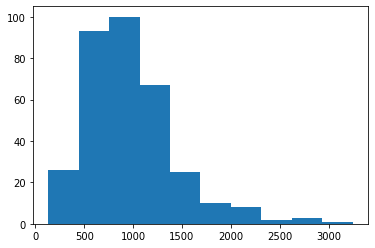

In [18]:
plt.hist(max1_)

(array([61., 62., 48., 57., 50., 22., 11., 12.,  6.,  6.]),
 array([ 141. ,  623.9, 1106.8, 1589.7, 2072.6, 2555.5, 3038.4, 3521.3,
        4004.2, 4487.1, 4970. ], dtype=float32),
 <a list of 10 Patch objects>)

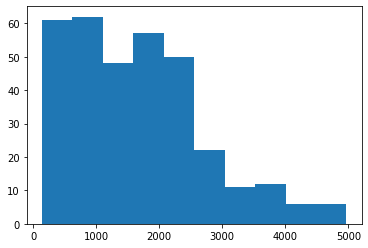

In [19]:
plt.hist(max2_)

BraTSDataset

In [23]:
class BraTSDataset(Dataset):
    def __init__(self, meta: pd.DataFrame, source_folder: [str, Path], nonzero_mask=False, transform=False):
        if isinstance(source_folder, str):
            source_folder = Path(source_folder)
            
        if nonzero_mask:
            meta = meta[meta.sample_id.isin(meta.query('is_nonzero_mask == True').sample_id)]
            
        self.source_folder = source_folder
        self.meta_images = meta.query('is_t2 == False').sort_values(by='sample_id').reset_index(drop=True)
        self.meta_masks = meta.query('is_t2 == True').sort_values(by='sample_id').reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return self.meta_images.shape[0]

    def __getitem__(self, i):
        image = load_numpy(self.source_folder / self.meta_images.iloc[i]['relative_path'], allow_pickle=True, decompress=True)#True
        mask = load_numpy(self.source_folder / self.meta_masks.iloc[i]['relative_path'], allow_pickle=True, decompress=True)#True
        sample = image, mask
        
        if self.transform:
            image, mask = self.transform(sample)

        return torch.from_numpy(image).reshape(1, 240, 240), torch.from_numpy(mask).reshape(1, 240, 240)#double

Meta creation

In [22]:
data_folder = Path('/content/flair_t2_del')
df = []

for path, _, files in tqdm(os.walk(data_folder)):
    for file in files:
        
        subject_id = path.split('/')[-1].split('_')[-1]
        slice_id = file.split('.')[0].split('_')[0]
        sample_id = f"{subject_id}_{slice_id}" # SubjectID_SliceIndex
        is_mask = 't2' in file
        if is_mask:
            mask = load_numpy(Path(path) / file, allow_pickle=True, decompress=True)#True
            is_nonzero_mask =  np.any(mask)
        else:
            is_nonzero_mask = np.nan
        
        df.append([Path(Path(path).stem) / file, sample_id, is_mask, subject_id, is_nonzero_mask])
        
df = pd.DataFrame(df, columns = ['relative_path', 'sample_id', 'is_t2', 'subject_id', 'is_nonzero_mask'])
print(df.is_nonzero_mask.value_counts())

df.to_csv(data_folder / 'meta.csv')


True     46107
False       57
Name: is_nonzero_mask, dtype: int64


In [24]:
df = pd.read_csv('/content/flair_t2_del/meta.csv', index_col=0)
dataset = BraTSDataset(df, data_folder, nonzero_mask=True)

Максимум по слайсам image1, image2 из del датасета



Проверка max() значений по слайсам image1 и image2 соответственно.

In [25]:
maxx = 0
maxy = 0
for i in range(len(dataset)):
    x, y = dataset[i]
    if x.max() > maxx:
        maxx = x.max()
    if y.max() > maxy:
        maxy = y.max()
    
print(maxx)
print(maxy)

tensor(3247.)
tensor(4970.)
